# Analyzing results from humann3 runs on 12 samples analyzed in [Front. Mar. Sci., 26 June 2020](https://www.frontiersin.org/articles/10.3389/fmars.2020.00439/full). Comparing results from humann3 profiling using the default Chocophlan + UniRef90 2020b versus a custom marine microbial DB (including both eukaryotic and prokaryotic organisms) obtained via Struo2 (prokaryotic genomes internally annotated via prodigal) + BUSCO & Augustus (eukaryotic genomes).  



BioProject PRJEB37134. Searchable via: https://sra-explorer.info/

**NOTE:** The following results were obtained by running HumanN3 with our custom DB: prok_euk_plankt_clustered_db_v2.1_201901b.dmnd  

Author: jayson.gutierrez@vliz.be

In [4]:
import matplotlib
%matplotlib inline
import matplotlib.pyplot as plt
from matplotlib import cm
import seaborn as sns
import colorsys
from matplotlib.collections import PatchCollection


import Bio.SeqIO as bioseqio
from Bio.Seq import Seq
from Bio.SeqRecord import SeqRecord
#from Bio.Alphabet import IUPAC
from Bio import Entrez

from ete3 import NCBITaxa
from taxonomy_ranks import TaxonomyRanks

from subprocess import Popen, call, STDOUT, PIPE
import os
import shutil
import pandas as pd
import numpy as np
import matplotlib
import json
import glob
import re
import gzip
import sys
import csv
import time
import io
import pathlib
from collections import OrderedDict

from IPython.display import Image
from itertools import combinations

In [5]:
#Customized functions for parsing and visualizing output data from HumanN-based profiling + our custo DB
from HumanN_data_processing import *

In [6]:
###Adding to sys.path the dir where pycircos is installed on my workstation
pycircos_path = '/home/VLIZ2000/jayson.gutierrez/anaconda3/envs/biobakery3/lib/python3.7/site-packages/pycircos/'
sys.path.append(pycircos_path)
from pycircos import Garc,Gcircle

In [7]:
import plotly.graph_objects as go
import plotly.io as pio
import plotly.express as px
###Uncomment below if necessary
rendef = "png" #"pdf" 
fig_renderer = pio.renderers[rendef]
fig_renderer.width = 1000
fig_renderer.height = 1000
pio.renderers.default = rendef

In [20]:
import warnings
warnings.filterwarnings("ignore")


In [8]:
!which python

/apps/gent/RHEL8/zen3-ampere-ib/software/Python/3.9.5-GCCcore-10.3.0/bin/python


In [9]:
matplotlib.rcParams['savefig.dpi'] = 1000
matplotlib.rcParams['figure.dpi'] = 1000
sns.set_style("whitegrid", {'axes.grid' : False})
sns.set_context("paper")
sns.set(font='serif')
# sns.set_style("white", {
#         "font.family": "serif",
#         "font.serif": ["Times", "Palatino", "serif"]
#     })
sns.set_style('ticks')

In [10]:
###Utility functions
 
def format_tax_lbl(taxid = '94617', tax_lvl=[]):
    """Function to properly format taxonomic labels compatible with HumanN"""
    
    tax_lvls_lbls = ['superkingdom', 'phylum', 'class', 'order', 'family', 'genus', 'species']
    rank_taxon = TaxonomyRanks(taxid)
    rank_taxon.get_lineage_taxids_and_taxanames()
    rank_dict =  list(rank_taxon.lineages.values())[0]
    tax_tree = list(rank_taxon.lineages.values())[0]
    if(len(tax_lvl)==0):
        return tax_tree
    else:
        return [tax_tree[k][0] for k in tax_lvl]

Load cpm-normalized gene family abundances with human-readable metabolic rxns 

In [56]:
#Data output from humann run with default DBs (chocophlan + UniRef90 2020b)
cpm_norm_gene_rxn_renamed_df0 = pd.read_csv("data_PRJEB37134/joint_samples_regrouped2rxn-cpm-named_v0.tsv", sep="\t")
cpm_norm_gene_rxn_renamed_df0.head()

,# Gene Family,ERR3980584_Qual_Filt_Abundance-CPM,ERR3980585_Qual_Filt_Abundance-CPM,ERR3980586_Qual_Filt_Abundance-CPM,ERR3980587_Qual_Filt_Abundance-CPM,ERR3980588_Qual_Filt_Abundance-CPM,ERR3980589_Qual_Filt_Abundance-CPM,ERR3980590_Qual_Filt_Abundance-CPM,ERR3980591_Qual_Filt_Abundance-CPM,ERR3980592_Qual_Filt_Abundance-CPM,ERR3980593_Qual_Filt_Abundance-CPM,ERR3980594_Qual_Filt_Abundance-CPM,ERR3980595_Qual_Filt_Abundance-CPM
0,UNMAPPED,1000000.0,1000000.0,999322.000000,1000000.0,1000000.0,1000000.0,1000000.0,1000000.0,1000000.0,1000000.0,1000000.0,1000000.0
1,UNGROUPED,0.0,0.0,674.642652,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,UNGROUPED|g__Cutibacterium.s__Cutibacterium_acnes,0.0,0.0,277.333997,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,UNGROUPED|g__Moraxella.s__Moraxella_osloensis,0.0,0.0,282.114621,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,UNGROUPED|g__Streptococcus.s__Streptococcus_mitis,0.0,0.0,115.194034,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


Filtering df to keep only entries where rxns were effectively identified/mapped to metacyc

In [21]:
cond_list0 = []
for gf in cpm_norm_gene_rxn_renamed_df0['# Gene Family'].values:
    if ('UNMAPPED' in gf) or ('UNGROUPED' in gf):
        cond_list0.append(False)
    else:
        cond_list0.append(True)

#Finally, get a filtered df
index_list0 = cpm_norm_gene_rxn_renamed_df0[cond_list0].sum(axis=1).sort_values(ascending=False).index.values
cpm_norm_gene_rxn_renamed_filtered_df0 = cpm_norm_gene_rxn_renamed_df0.iloc[index_list0].reset_index(drop=True)

In [22]:
#Let's peek at top 5 most abundant rxns across all samples
cpm_norm_gene_rxn_renamed_filtered_df0.head()

,# Gene Family,ERR3980584_Qual_Filt_Abundance-CPM,ERR3980585_Qual_Filt_Abundance-CPM,ERR3980586_Qual_Filt_Abundance-CPM,ERR3980587_Qual_Filt_Abundance-CPM,ERR3980588_Qual_Filt_Abundance-CPM,ERR3980589_Qual_Filt_Abundance-CPM,ERR3980590_Qual_Filt_Abundance-CPM,ERR3980591_Qual_Filt_Abundance-CPM,ERR3980592_Qual_Filt_Abundance-CPM,ERR3980593_Qual_Filt_Abundance-CPM,ERR3980594_Qual_Filt_Abundance-CPM,ERR3980595_Qual_Filt_Abundance-CPM
0,CYSPH-RXN: (expasy) Cystathionine gamma-syntha...,0.0,0.0,1.31489,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,CYSPH-RXN: (expasy) Cystathionine gamma-syntha...,0.0,0.0,1.31489,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,RXN-9384: (expasy) Cystathionine gamma-synthas...,0.0,0.0,1.31489,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,RXN-9384: (expasy) Cystathionine gamma-synthas...,0.0,0.0,1.31489,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,RXN-18602: (expasy) Cystathionine gamma-syntha...,0.0,0.0,1.31489,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [23]:
#Load cpm-normalized gene family abundances with human-readable metabolic rxns 
#Data output from humann run with custom DBs (eukayotic + prokaryotic gene sequences annotated against UniRef90 2021)
cpm_norm_gene_rxn_renamed_df1 = pd.read_csv("data_PRJEB37134/joint_samples_regrouped2rxn-cpm-named_v1.tsv", sep="\t")
cpm_norm_gene_rxn_renamed_df1.head()

,# Gene Family,ERR3980584_Qual_Filt_Abundance-CPM,ERR3980585_Qual_Filt_Abundance-CPM,ERR3980586_Qual_Filt_Abundance-CPM,ERR3980587_Qual_Filt_Abundance-CPM,ERR3980588_Qual_Filt_Abundance-CPM,ERR3980589_Qual_Filt_Abundance-CPM,ERR3980590_Qual_Filt_Abundance-CPM,ERR3980591_Qual_Filt_Abundance-CPM,ERR3980592_Qual_Filt_Abundance-CPM,ERR3980593_Qual_Filt_Abundance-CPM,ERR3980594_Qual_Filt_Abundance-CPM,ERR3980595_Qual_Filt_Abundance-CPM
0,UNMAPPED,730925.000000,813235.000000,813338.000000,721241.000000,736503.000000,837841.000000,427682.000000,452088.000000,475031.000000,509271.000000,473569.000000,543602.000000
1,UNGROUPED,256084.792896,178386.139014,176878.958748,264865.554961,252819.023058,150165.966639,563667.362295,539158.975943,518271.587342,468989.979920,504512.064243,437151.464163
2,UNGROUPED|g__Acanthamoeba.s__Acanthamoeba_lent...,7.847477,30.990215,19.523537,11.461667,23.752424,6.249372,17.322355,9.073994,14.829261,3.129272,8.104784,22.685557
3,UNGROUPED|g__Acanthamoeba.s__Acanthamoeba_royr...,22.459579,49.142305,51.500938,19.228387,42.168013,12.613371,194.614016,252.007319,172.710953,7.766932,5.253655,49.923108
4,UNGROUPED|g__Acaulopage.s__Acaulopage_tetracer...,0.593829,0.792097,0.375127,0.469829,1.311551,1.106981,10.864897,10.613300,3.442030,0.426451,0.550225,1.404500


In [25]:
for i in np.random.choice(cpm_norm_gene_rxn_renamed_df1["# Gene Family"].values,10,replace=False):
    if((";" not in i.split("|")[-1]) and ('UNMAPPED' not in i) and ('UNGROUPED' not in i) and ('g__' in i)):
        print(i)

RXN-21691: (expasy) 3-oxoacyl-[acyl-carrier-protein] reductase [1.1.1.100]|g__Eucampia.s__Eucampia_antarctica__49252
RXN-20336: (expasy) Very-long-chain 3-oxoacyl-CoA synthase [2.3.1.199]|g__Fragilariopsis.s__unclassified__186035
RXN0-722: (expasy) Ribonucleoside-diphosphate reductase [1.17.4.1]|g__Kryptoperidinium.s__Kryptoperidinium_foliaceum__160619
H2PTEROATESYNTH-RXN: (expasy) Dihydropteroate synthase [2.5.1.15]|g__Thalassiosira.s__Thalassiosira_antarctica__160265
DIHYDROXYISOVALDEHYDRAT-RXN: (expasy) Dihydroxy-acid dehydratase [4.2.1.9]|g__Corethron.s__Corethron_hystrix__216773
SUCCINATE-DEHYDROGENASE-UBIQUINONE6-RXN: (expasy) Succinate dehydrogenase (quinone) [1.3.5.1]|g__Pterosperma.s__unclassified__38835
RIBOKIN-RXN: (expasy) Ribokinase [2.7.1.15]|g__Dactyliosolen.s__Dactyliosolen_fragilissimus__1118495
1.18.1.2-RXN: (expasy) Ferredoxin--NADP(+) reductase [1.18.1.2]|g__Stephanopyxis.s__Stephanopyxis_turris__515487
RXN-17024: (expasy) 1-acylglycerol-3-phosphate O-acyltransferas

In [26]:
cond_list1 = []
for gf in cpm_norm_gene_rxn_renamed_df1['# Gene Family'].values:
    if ('UNMAPPED' in gf) or ('UNGROUPED' in gf):
        cond_list1.append(False)
    else:
        cond_list1.append(True)

#Finally, get a filtered df
index_list1 = cpm_norm_gene_rxn_renamed_df1[cond_list1].sum(axis=1).sort_values(ascending=False).index.values
cpm_norm_gene_rxn_renamed_filtered_df1 = cpm_norm_gene_rxn_renamed_df1.iloc[index_list1].reset_index(drop=True)

In [27]:
#Let's peek at top 5 most abundant rxns across all samples
cpm_norm_gene_rxn_renamed_filtered_df1.head()["# Gene Family"].values

array(['PEPTIDYLPROLYL-ISOMERASE-RXN: (expasy) Peptidylprolyl isomerase [5.2.1.8]',
       'GAPOXNPHOSPHN-RXN: (expasy) Glyceraldehyde-3-phosphate dehydrogenase (phosphorylating) [1.2.1.12]',
       'RXN1YI0-11: (expasy) Glyceraldehyde-3-phosphate dehydrogenase (phosphorylating) [1.2.1.12]',
       'ADENOSYLHOMOCYSTEINASE-RXN: (expasy) Adenosylhomocysteinase [3.3.1.1]',
       '3.4.25.1-RXN: (expasy) Proteasome endopeptidase complex [3.4.25.1]'],
      dtype=object)

Now let's have a look at how the set of gene families mapped to metabolic rxns are distributed across different species, and check the degree of overlap between the two sets of rxns identified (i.e. humann hits with default vs. custom dbs)

In [28]:
#Let's see how many species each rxn mapped is distributed across the different samples considered
rxns_sps_dist_list0 = cpm_norm_gene_rxn_renamed_filtered_df0["# Gene Family"].apply(lambda s: s.split("|")[0]).value_counts()
rxns_sps_dist_list0

CYSPH-RXN: (expasy) Cystathionine gamma-synthase [2.5.1.48]                        2
RXN-9384: (expasy) Cystathionine gamma-synthase [2.5.1.48]                         2
RXN-18602: (expasy) Cystathionine gamma-synthase [2.5.1.48]                        2
O-SUCCHOMOSERLYASE-RXN: (expasy) Cystathionine gamma-synthase [2.5.1.48]           2
THIAMINASE-RXN: (expasy) Aminopyrimidine aminohydrolase [3.5.99.2]                 2
RXN-12613: (expasy) Aminopyrimidine aminohydrolase [3.5.99.2]                      2
RXN-20927: (expasy) DNA-directed DNA polymerase [2.7.7.7]                          2
DNA-DIRECTED-DNA-POLYMERASE-RXN: (expasy) DNA-directed DNA polymerase [2.7.7.7]    2
GLUTAMIDOTRANS-RXN: (expasy) Imidazole glycerol-phosphate synthase [4.3.2.10]      2
Name: # Gene Family, dtype: int64

In [29]:
#This gives an even more compact idea of the diversity of entire rxns mapped: EC numbers
ec_mapped_list0 = rxns_sps_dist_list0.index.map(lambda s:s.split('[')[-1].replace(']','')).value_counts()
ec_mapped_list0

2.5.1.48    4
3.5.99.2    2
2.7.7.7     2
4.3.2.10    1
dtype: int64

In [30]:
#Let's see how many species each rxn mapped is distributed across the different samples considered
rxns_sps_dist_list1 = cpm_norm_gene_rxn_renamed_filtered_df1["# Gene Family"].apply(lambda s: s.split("|")[0]).value_counts()
rxns_sps_dist_list1

PEPTIDYLPROLYL-ISOMERASE-RXN: (expasy) Peptidylprolyl isomerase [5.2.1.8]    312
3.1.3.16-RXN: (expasy) Protein-serine/threonine phosphatase [3.1.3.16]       264
3.4.25.1-RXN: (expasy) Proteasome endopeptidase complex [3.4.25.1]           231
RXN-21394: (expasy) Succinate dehydrogenase (quinone) [1.3.5.1]              191
RXN1YI0-14: (expasy) Succinate dehydrogenase (quinone) [1.3.5.1]             191
                                                                            ... 
RXN-19242: (expasy) Deoxyribodipyrimidine photo-lyase [4.1.99.3]               2
RXN-19243: (expasy) Deoxyribodipyrimidine photo-lyase [4.1.99.3]               2
RXN-19246: (expasy) Deoxyribodipyrimidine photo-lyase [4.1.99.3]               2
RXN-19244: (expasy) Deoxyribodipyrimidine photo-lyase [4.1.99.3]               2
RXN-18936: (expasy) Microsomal epoxide hydrolase [3.3.2.9]                     2
Name: # Gene Family, Length: 1789, dtype: int64

In [31]:
#This gives an even more compact idea of the diversity of entire rxns mapped: EC numbers
ec_mapped_list1 = rxns_sps_dist_list1.index.map(lambda s:s.split('[')[-1].replace(']','')).value_counts()
ec_mapped_list1

1.1.1.100              42
4.2.1.59               39
2.3.1.16               36
6.2.1.3                35
4.2.1.17               29
                       ..
4.1.3.44                1
3.5.1.1; 3.5.1.38       1
1.8.4.11                1
1.11.1.21; 1.11.1.6     1
3.2.1.10                1
Length: 766, dtype: int64

The following is the set of rxns (EC numbers) that were uniquely mapped via our custom DB. In summary, this gives us an idea of how beneficial might a custom DB be for mapping an increasingly wider spectrum of metabolic rxns

In [32]:
diff_ec_set_custom_db = list(set(ec_mapped_list1.index).difference(set(ec_mapped_list0.index)))

In [33]:
#Let's now create a dict associating an EC number with all the instances identified via our custom DB
ec2instances = OrderedDict()
for ec in diff_ec_set_custom_db:
        ec2instances[ec] = rxns_sps_dist_list1[rxns_sps_dist_list1.index.str.contains('{}]'.format(ec))].index.unique()

In [34]:
#This gives the total number of ec IDs identified
ec_mapped_list0.shape[0],ec_mapped_list1.shape[0],len(diff_ec_set_custom_db)

(4, 766, 762)

In [35]:
#Here we print the number of unique rxns mapped using our custom DB. NOTE: AMBIGUOUS are not taken into account
n=0
for unique_ec in diff_ec_set_custom_db:
    n+=1
    if(n>=10):
        break    
    ec_rxn = ec2instances[unique_ec].values[0]
    if('AMBIGUOUS' not in ec_rxn):
        print(ec_rxn + "\n")
    

3-DEHYDROQUINATE-SYNTHASE-RXN: (expasy) 3-dehydroquinate synthase [4.2.3.4]

RXN-16551: (expasy) Alcohol-forming fatty acyl-CoA reductase [1.2.1.84]

RXN-8782: (expasy) L-sorbose 1-dehydrogenase [1.1.99.32]

FGAMSYN-RXN: (expasy) Phosphoribosylformylglycinamidine synthase [6.3.5.3]

L-GLN-FRUCT-6-P-AMINOTRANS-RXN: (expasy) Glutamine--fructose-6-phosphate transaminase (isomerizing) [2.6.1.16]

RXN-12458: (expasy) tRNA (guanine(37)-N(1))-methyltransferase [2.1.1.228]

NAD-SYNTH-GLN-RXN: (expasy) NAD(+) synthase (glutamine-hydrolyzing) [6.3.5.1]

HYDROXYPYRUVATE-REDUCTASE-RXN: (expasy) Hydroxypyruvate reductase [1.1.1.81]

RXN-12440: (expasy) L-ascorbate peroxidase [1.11.1.11]



Cast in a df the data on unique EC IDs mapped by humann3 using either the Default vs. the Custom DBs

In [1019]:
# ec_set0_df = pd.DataFrame.from_dict({"EC":ec_mapped_list0.index, "DB":"Default"})
# #Keep only one EC per entry
# ec_set0_df["EC"] = ec_set0_df["EC"].apply(lambda s: s.split(";")[0])

# ec_set1_df = pd.DataFrame.from_dict({"EC":ec_mapped_list1.index, "DB":"Custom"})
# #Keep only one EC per entry
# ec_set1_df["EC"] = ec_set1_df["EC"].apply(lambda s: s.split(";")[0])

# ec_set_merged = pd.concat([ec_set0_df,ec_set1_df])

## ec_set_merged.to_csv("EC_IDs_Humann3_Mapped.csv",index=False)

Comparatively, the custom DB outperforms by almost two orders of magnitude the default DBs used by HumanN, in terms of mapped enzymes

In [28]:
input_file = 'data_PRJEB37134/EC_IDs_Humann3_Mapped.csv'
output_file = 'data_PRJEB37134/VennDiag_ECNumbers.png'
py_script = './plot_venn_diagram.py'

In [29]:
# fig, ax = plt.subplots(figsize=(15,10))
# matplotlib.style.use('seaborn-white')
# ec_counts = pd.read_csv(input_file)["DB"].value_counts().sort_values()
# ec_counts.plot.bar(ax=ax, color=["r","b"])
# ax.set_xlabel("Database type", fontsize=20)
# ax.set_ylabel("Total unique E.C. numbers mapped by HUMAnN 3.0\n(log-scale)", fontsize=20)
# ax.tick_params(axis='y', labelsize=16)
# ax.tick_params(axis='x', labelsize=20)
# sns.set_style('ticks')
# ax.set_yscale("log")
# sns.despine()
# fig.show()

#### In a script that runs on a different conda environment, I load in the EC_IDs_Humann3_Mapped.csv df and created the Venn diagram shown below.   
This figure is to illustrate the relative effectiveness of the DBs considered to map individual enzymes. Clearly, running Humann3 with the custom DB  improves significantly our ability to map a larger number of enzymes

In [30]:
# #Run python script on the command line
# !/home/VLIZ2000/jayson.gutierrez/anaconda3/envs/biobakery3/bin/python $py_script $input_file $output_file

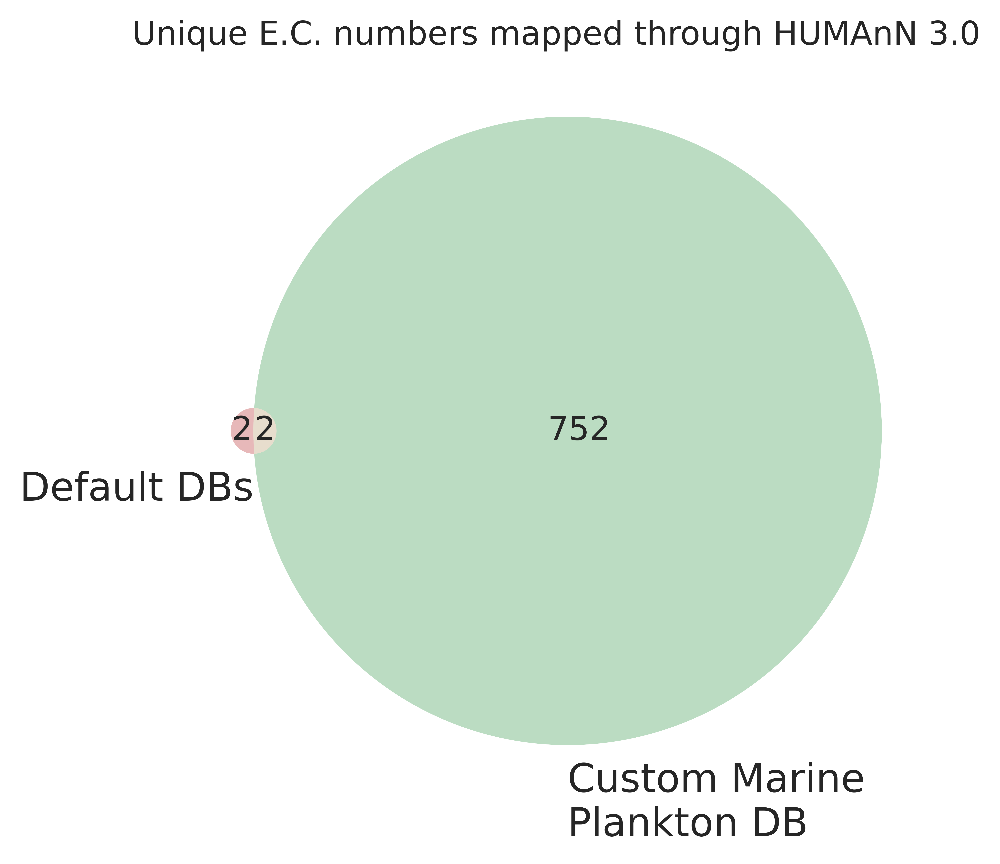

In [36]:
from IPython.display import Image
Image(filename='data_PRJEB37134/VennDiag_ECNumbers.png',width=700,height=400,embed=True)

#### Enumerating PWYs identified across samples and taxonomic groups down to the genus level

In [24]:
# file_patt = "custom_humann_prof_results_{}/ERR*{}*.tsv"
# #Get samples sorted by ID
# default_db_profiling = sorted(glob.glob(file_patt.format("0","pathabundance")),key=lambda s:int(s.split('/ERR')[-1].split("_")[0]))
# custom_db_profiling = sorted(glob.glob(file_patt.format("1","pathabundance")),key=lambda s:int(s.split('/ERR')[-1].split("_")[0]))

# #Cast pathway data into dfs
# default_db_unique_pwys_df = stack_pwy_dfs(default_db_profiling).drop_duplicates(subset='Pathway', keep="last").reset_index(drop=True)
# custom_db_unique_pwys_df = stack_pwy_dfs(custom_db_profiling).drop_duplicates(subset='Pathway', keep="last").reset_index(drop=True)

In [25]:
# #Total number of samples profiled
# tot_num_prof_samples = cpm_norm_gene_rxn_renamed_df0.columns.drop('# Gene Family').shape[0]
# #Number of samples effectivelly profiled using both types of DBs
# num_eff_prof_samples = len(set(custom_db_unique_pwys_df["Sample"].unique()).union(set(default_db_unique_pwys_df["Sample"].unique())))

In [26]:
# #Here we just summarize the total number of unique species found active across all the samples analyzed
# sps_list_cont = []
# for fid in custom_db_profiling:
#     df = pd.read_csv(fid,sep='\t')
#     df2 = df[~df["# Pathway"].str.contains("UNMAPPED|UNINTEGRATED")]
#     sps_list = df2[df2["# Pathway"].str.contains("g__")]["# Pathway"].apply(lambda s: s.split("|")[-1]).unique().tolist()
#     tax_ids_series = pd.Series(sps_list).apply(lambda s: s.split("__")[-1])
#     tax_ids_series.index = pd.Series(sps_list).apply(lambda s: "__".join(s.split("__")[:-1])).values
#     tax_ids_series.drop_duplicates(inplace=True)
#     sps_list_cont.append(tax_ids_series)

# #Totality of unique species found across all samples analyzed
# unique_sps_full_list = pd.concat(sps_list_cont).drop_duplicates().index

### Let's now create a stacked barplot to visualize genus-level pathway counts across the different samples considered

In [27]:
#Utility function to generate a list of colors
# def _get_colors(num_colors):
#     colors=[]
#     for i in np.arange(0., 360., 360. / num_colors):
#         hue = i/360.
#         lightness = (50 + np.random.rand() * 10)/100.
#         saturation = (90 + np.random.rand() * 10)/100.
#         colors.append(colorsys.hls_to_rgb(hue, lightness, saturation))
#     return colors

In [28]:
# #Cast into a single df data sets above on genus associated pathway activity for both DBs
# genus_based_pwy_df = pd.concat([make_pathway_wise_df(custom_db_profiling, "Custom-DB"),
#                                 make_pathway_wise_df(default_db_profiling, "Default-DBs")])

# # sorted_genus_based_pwy_df = genus_based_pwy_df.groupby('DB-type')["Pathway"].value_counts().unstack(0).fillna(0).sort_values(by='Custom-DB',
# #                                                                                                                              ascending=False)

In [29]:
# #Set list of unique pwy IDs
# unique_pwy_list = genus_based_pwy_df["Pathway"].apply(lambda s: s.split(":")[0]).unique()
# #Set list of unique genus NCBI IDs
# unique_genus_list = genus_based_pwy_df["Pathway"].apply(lambda s: s.split(":")[-1]).unique()

In [30]:
# #Set dict to store dicts associating genra with their observations at the pwy level
# pwy2genus_counts_dict = {}
# for upid in unique_pwy_list:
#     pwy_counts_across_genus = genus_based_pwy_df["Pathway"][genus_based_pwy_df['Pathway'].str.contains(upid)]
#     #Get dict mapping genus to counts
#     genus2counts_dict = pwy_counts_across_genus.apply(lambda s: s.split(":")[-1]).value_counts().to_dict()
#     pwy2genus_counts_dict[upid] = genus2counts_dict

In [31]:
# full_pwy_names = genus_based_pwy_df["Pathway"].apply(lambda s: s.split(":")[1]).value_counts().index.values
# short_pwy_names = genus_based_pwy_df["Pathway"].apply(lambda s: s.split(":")[0]).value_counts().index.values
# short2full_pwy_names = dict(zip(short_pwy_names,full_pwy_names))

In [37]:
# #Then convert the above dict into a DF: summary of per-genus pathway observations/counts/hits across the different samples analyzed (12)
# pwy_enum_summary_df = pd.DataFrame.from_dict(pwy2genus_counts_dict).T
# #Sort idx according to aggregated counts across genra
# sorted_idxs = pwy_enum_summary_df.sum(axis=1).sort_values(ascending=False).index
# #Sorted df from most to less frequently observed pwy across samples
# sorted_pwy_enum_summary_df = pwy_enum_summary_df.loc[sorted_idxs]#.fillna(0)
# #Set full pathway name as index
# sorted_pwy_enum_summary_df.index = sorted_pwy_enum_summary_df.index.map(short2full_pwy_names)
# #Given that the list of genra is large, let's cutoff this by focusing on the top genra with the most pwy observations across samples
# top_genra = sorted_pwy_enum_summary_df.columns[sorted_pwy_enum_summary_df.sum(axis=0).sort_values(ascending=False)>40]
# print("No. selected genera to display on the bar chart: {}".format(top_genra.shape[0]))
# #Fetch the sample from original df
# top_sorted_pwy_enum_summary_df = sorted_pwy_enum_summary_df[top_genra]
# #Drop rows with 0 count
# top_sorted_pwy_enum_summary_df = top_sorted_pwy_enum_summary_df.loc[top_sorted_pwy_enum_summary_df.sum(axis=1)>0,:]
# #Then sort based on rows
# top_sorted_pwy_enum_summary_df = top_sorted_pwy_enum_summary_df.loc[top_sorted_pwy_enum_summary_df.sum(axis=1).sort_values(ascending=False).index]
# top_sorted_pwy_enum_summary_df.columns = top_sorted_pwy_enum_summary_df.columns.map(lambda s: s.replace(" ",""))
# #Change columns to include in addition to the genus the number of species associated in parehtesis
# top_sorted_pwy_enum_summary_df.columns = top_sorted_pwy_enum_summary_df.columns.map(lambda s: "{} ({})".format(s, unique_sps_full_list.str.contains(s).sum()))

In [33]:
# #Create a palette to identify genera
# palette = sns.color_palette("rainbow",256).as_hex()
# #col_list = np.array(palette[::6])[:top_genra.shape[0]]
# col_list = np.random.choice(palette[::6],size=top_genra.shape[0],replace=False)
# #col_list = _get_colors(top_genra.shape[0])

#### Finally, the barchart below provides a summary of the most active metabolic pathways driving the activity of the distinct plankton communities found across the different samples analyzed (BioProject PRJEB37134) profiled with HumanN using our custom DB.  
**Metabolic pathway overview stratified across genera**

In [42]:
# fig, ax = plt.subplots(figsize = (25,10))
# top_sorted_pwy_enum_summary_df.plot.bar(stacked=True, ax=ax, color=col_list)
# ax.legend(loc='upper center', bbox_to_anchor=(0.5, 1.0), ncol=5, fontsize = 18)
# ax.tick_params(axis='both', labelsize=20)
# ax.set_xlabel("Metabolic pathway", fontdict={"fontsize":26})
# ax.set_ylabel("Aggregated pathway count across samples", fontdict={"fontsize":26})
# sns.despine()
# fig.show()

In [321]:
# fig, ax = plt.subplots(figsize=(16,22))
# matplotlib.style.use('fivethirtyeight')
# sorted_genus_based_pwy_df[sorted_genus_based_pwy_df['Custom-DB']>10].plot.barh(stacked=True,ax=ax)

# ax.set_xlabel("Prevalence (hits) across samples analyzed".format(tot_num_prof_samples), 
#               fontdict={"fontsize":30})
# ax.set_ylabel("Genus-associated metabolic pathway\n", fontdict={"fontsize":30})
# ax.set_title("Metabolic pathway identification\n", fontdict={"fontsize":35})
# ax.legend(title = 'DB type', labels = ["Custom", "Default"],
#           title_fontsize=25, fontsize=20)
# ax.tick_params(axis='y', labelsize=18)
# ax.tick_params(axis='x', labelsize=18)
# sns.despine()
# plt.grid(False)
# plt.show()

#### Now, let's focus on analyzing metabolic pathway abundances across samples and the numerous taxa observed

In [39]:
table_fid = "data_PRJEB37134/joint_samples_path_abundance-cpm.tsv"
custom_db_pwy_abund_df = reshape_joint_pwy_abund_df(table_fid, "ERR")
# custom_db_pwy_abund_df.to_csv("custom_humann_prof_results_1/reshaped_joint_samples_path_abundance-cpm.tsv",sep="\t")
pwy_abund_full = pd.read_csv(table_fid,sep='\t')

In [40]:
#Grab all species-specific pawy abundances
idx2pwy_dict = pwy_abund_full['# Pathway'].to_dict()
idx_list = []
for k in idx2pwy_dict:
    v = idx2pwy_dict[k]
    if (v!='UNMAPPED') and ('UNINTEGRATED' not in v) and ('|g__' in v):
        idx_list.append(k)
        
#Filter out the original pwy abundance df
filtered_pwy_abund_full = pwy_abund_full.iloc[idx_list,:]
filtered_pwy_abund_full.reset_index(drop=True, inplace=True)

old_sample_ids = filtered_pwy_abund_full.iloc[:,1:].columns
new_sampled_ids = list(map(lambda s: s.split("_")[0],old_sample_ids))
#Rename column names
filtered_pwy_abund_full.rename(columns=dict(zip(old_sample_ids,new_sampled_ids)),inplace=True)

#Create intermediary DF to reshape filtered_pwy_abund_full
new_filtered_pwy_abund_full = pd.DataFrame.from_records(filtered_pwy_abund_full['# Pathway'].apply(lambda s: s.split('|')).values, 
                                                        columns=["PWY","Species"]).set_index("PWY")

#Reassign index and first column of filtered_pwy_abund_full
filtered_pwy_abund_full.index = new_filtered_pwy_abund_full.index
filtered_pwy_abund_full['# Pathway'] = new_filtered_pwy_abund_full['Species']
filtered_pwy_abund_full.rename(columns={'# Pathway':'Species'},inplace=True)

#### Let's plot a heatmap illustrating aggregated metabolic pathway activity across species observed in a given sample, with annotations indicating the number of contributing species to the pathway activity in question.

In [41]:
x_labels = filtered_pwy_abund_full.index.unique()
y_labels = filtered_pwy_abund_full.columns[1:]

pwy_persample_agg_abund = {}
pwy_persample_tot_num_sps = {}
for pwy_id in x_labels:
    strat = filtered_pwy_abund_full.loc[pwy_id]
    if(len(strat.shape)>1):
        pwy_persample_agg_abund[pwy_id] = strat[y_labels].sum().to_dict()
        pwy_persample_tot_num_sps[pwy_id] = (1*(strat[y_labels]!=0)).sum().to_dict()
    else:
        pwy_persample_agg_abund[pwy_id] = strat.loc[y_labels].to_dict()
        pwy_persample_tot_num_sps[pwy_id] = (1*(strat.loc[y_labels]!=0)).to_dict()

In [42]:
#Cast dict as DFs
pwy_persample_agg_abund_df = pd.DataFrame.from_dict(pwy_persample_agg_abund)
#Let's filter pwys with aggregated abundances >=3
filtered_abudant_pwys = pwy_persample_agg_abund_df.sum()
sorted_filtered_abudant_pwys = filtered_abudant_pwys[filtered_abudant_pwys>=3].sort_values()
pwy_persample_agg_abund_df = pwy_persample_agg_abund_df[sorted_filtered_abudant_pwys.index]

pwy_persample_tot_num_sps_df = pd.DataFrame.from_dict(pwy_persample_tot_num_sps)
#Make sure that indexes and cols match each other
pwy_persample_tot_num_sps_df = pwy_persample_tot_num_sps_df[sorted_filtered_abudant_pwys.index].loc[pwy_persample_agg_abund_df.index]

In [43]:
#Create a mask matrix for better visualization
mask_df = (pwy_persample_tot_num_sps_df<1)
quant_df = (pwy_persample_agg_abund_df+1).applymap(np.log10)
quant_df.columns = quant_df.columns.map(lambda s: s.split(": ")[-1].capitalize())

In [44]:
#Mapping SRA IDs to geographical location where samples were taken
sample2loc = {'ERR3980584':['Iceland coastal water Breidafjordur_Faxafloi MSM21-3','Iceland (station 1)'],
              'ERR3980585':['Iceland coastal water Breidafjordur_Faxafloi MSM21-3', 'Iceland (station 1)'],
              'ERR3980586':['Iceland coastal water Breidafjordur_Faxafloi MSM21-3', 'Iceland (station 1)'],
              'ERR3980587':['Iceland coastal water Arnarfjordur MSM21-3', 'Iceland (station 2)'],
              'ERR3980588':['Iceland coastal water Arnarfjordur MSM21-3', 'Iceland (station 2)'],
              'ERR3980589':['Iceland coastal water Arnarfjordur MSM21-3', 'Iceland (station 2)'],
              'ERR3980590':['Greenland coastal water Disko Bay MSM21-3', 'Greenland (station 1)'],
              'ERR3980591':['Greenland coastal water Disko Bay MSM21-3', 'Greenland (station 1)'],
              'ERR3980592':['Greenland coastal water Disko Bay MSM21-3', 'Greenland (station 1)'],
              'ERR3980593':['Greenland coastal water Vaigat Strait MSM21-3', 'Greenland (station 2)'],
              'ERR3980594':['Greenland coastal water Vaigat Strait MSM21-3', 'Greenland (station 2)'],
              'ERR3980595':['Greenland coastal water Vaigat Strait MSM21-3', 'Greenland (station 2)']}

In [45]:
#Rename idx with location and station
new_idx = []
for k in list(sample2loc.keys()):
    new_idx.append(sample2loc[k][-1])
    
quant_df.index = new_idx

In [57]:
#Detailed breakdown of the prevalence of different metabolic pathways across the different samples considered
fig, ax = plt.subplots(figsize=(10,20))
sns.heatmap(quant_df.T, 
            annot = pwy_persample_tot_num_sps_df.values.T, 
            cmap = 'jet', 
            mask = mask_df.values.T,
            ax = ax, 
            linewidth=1, linecolor='w', fmt='',
            cbar_kws = {"label":"Counts per million mapped reads (Log-scale)",
                        "orientation":"vertical","shrink":0.9, "extend":"both", 
                        "drawedges":True, "pad":0.01},
            annot_kws = {'size':18})

ax.figure.axes[-1].yaxis.label.set_size(24)
ax.figure.axes[-1].tick_params(axis='y', labelsize=18)
ax.tick_params(axis='both', labelsize=20)
ax.set_ylabel("Metabolic pathway (MetaCyc annotation)", fontsize=30)
ax.set_xlabel("Sample ID", fontsize=30)
plt.show()

Assessing some metabolic features, such as primary metabolic pathways involved in amino acid and nucleotide biosynthesis, energy metabolism, lipid and carbohydrates biosynthesis

In [47]:
primary_pwys = []
for i in quant_df.columns:
    if("adenosine" in i.lower() or "guanosine" in i.lower() or "acid" in i.lower() or "carboh" in i.lower() \
       or "biosynthesis" in i.lower() or "glyco" in i.lower() or "ligh" in i.lower() or "calvin" in i.lower() or "pentose" in i.lower()):
        print(i)
        primary_pwys.append(i)

Gondoate biosynthesis (anaerobic)
Ubiquinol-7 biosynthesis (late decarboxylation)
Superpathway of l-threonine biosynthesis
Adenine and adenosine salvage iii
Superpathway of l-phenylalanine and l-tyrosine biosynthesis
L-methionine biosynthesis iii
Photosynthesis light reactions
Superpathway of l-aspartate and l-asparagine biosynthesis
Superpathway of adenosine nucleotides de novo biosynthesis i
Superpathway of adenosine nucleotides de novo biosynthesis ii
Heme b biosynthesis v (aerobic)
4-hydroxybenzoate biosynthesis iii (plants)
Pentose phosphate pathway (non-oxidative branch) ii
Calvin-benson-bassham cycle
Fatty acid &beta;-oxidation i (generic)
Glycolysis ii (from fructose 6-phosphate)
Superpathway of l-serine and glycine biosynthesis i
Gdp-mannose biosynthesis
Fatty acid &beta;-oxidation ii (plant peroxisome)
Pentose phosphate pathway (non-oxidative branch) i
Superpathway of guanosine nucleotides de novo biosynthesis i
Heme b biosynthesis i (aerobic)
Guanosine ribonucleotides de nov

Next, let's focus on the metabolic contribution of the following clades: Bacillariophyta/diatoms and Dinophyta/Dinophyceae

In [48]:
filtered_pwy_abund_full2 = filtered_pwy_abund_full.copy()
filtered_pwy_abund_full2.index = filtered_pwy_abund_full2.index.map(lambda s: s.split(":")[-1].strip().capitalize())
ncbi_taxids_series = filtered_pwy_abund_full2.loc[primary_pwys]["Species"].map(lambda s: s.split('__')[-1])
#Add extra taxonomic classification to track down lower levels in the tree
tax_lvls = ['phylum','class']
extra_tax_lvls_series = ncbi_taxids_series.map(lambda s: format_tax_lbl(s, tax_lvls))
extra_tax_lvls_df = pd.DataFrame.from_records(extra_tax_lvls_series.to_list(), index=extra_tax_lvls_series.index, columns=tax_lvls)
#Finally, we get the new DF with the required extra taxonomic description
filtered_pwy_abund_full3 = pd.concat([extra_tax_lvls_df,filtered_pwy_abund_full2.loc[primary_pwys]], axis=1)

In [49]:
#Let's create separate dfs fro diatoms and dinos
diatoms_df = filtered_pwy_abund_full3[filtered_pwy_abund_full3['phylum']=='Bacillariophyta']
dinoflagellates_df = filtered_pwy_abund_full3[filtered_pwy_abund_full3['class']=='Dinophyceae']

In [50]:
#Here we create a df for number of diatoms vs dinos contributing to overall primary metabolic activities across samples
diatom_counts_df = []
diatoms_mask_df = (diatoms_df.iloc[:,3:]>0).values.T
for v in diatoms_mask_df:
    diatom_counts_df.append(diatoms_df["Species"][v].shape[0])
    
dinoflagellates_counts_df = []
dinoflagellates_mask_df = (dinoflagellates_df.iloc[:,3:]>0).values.T
for v in dinoflagellates_mask_df:
    dinoflagellates_counts_df.append(dinoflagellates_df["Species"][v].shape[0])
    
diatom_dinos_counts_df = pd.DataFrame.from_dict({'Diatoms':diatom_counts_df,'Dinoflagellates':dinoflagellates_counts_df})

In [51]:
#Calculating ggregated primary metabolic activity across samples for all species detected in respective samples
agg_primary_pwy_act = filtered_pwy_abund_full2.loc[primary_pwys].iloc[:,1:].sum()
#Calculating ggregated primary metabolic activity across samples for all diatoms (Bacillariophyta) detected in respective samples
agg_diatoms_primary_pwy_act = diatoms_df.iloc[:,3:].sum()/agg_primary_pwy_act
#Calculating ggregated primary metabolic activity across samples for all dinos (Dinophyceae) detected in respective samples
agg_dinoflagellates_primary_pwy_act = dinoflagellates_df.iloc[:,3:].sum()/agg_primary_pwy_act

In [52]:
#Create one single df for creating a stacked barchart
concat_agg_primary_pwy_act = pd.concat([agg_diatoms_primary_pwy_act,agg_dinoflagellates_primary_pwy_act],
                                       keys=['Diatoms','Dinoflagellates'],axis=1)
#Rename indexes based on sampling stations
concat_agg_primary_pwy_act.index = concat_agg_primary_pwy_act.index.map(lambda s: sample2loc[s][-1])
diatom_dinos_counts_df.index = concat_agg_primary_pwy_act.index 

Now let's check how prevalent is each major taxonomic group in terms of aggregated contribution to overall primary metabolism in the community, across the different stations/geographical locations

In [62]:
fig, ax = plt.subplots(figsize=(15,6))
concat_agg_primary_pwy_act.plot.bar(stacked=True, color=['b','r'], ax=ax)
ax.tick_params(axis='y', labelsize=16)
ax.tick_params(axis='x', labelsize=20)
ax.set_ylabel("Relative contribution to\ntotal primary metabolism", fontsize=20)
ax.set_xlabel("Sample ID", fontsize=20)

# Make labels indicating the ratio of diatoms/dinos variably contributing to total primary metabolic activity.
labels = diatom_dinos_counts_df.apply(lambda s: f"{s[0]}/{s[1]}", axis=1).values
heights = concat_agg_primary_pwy_act.sum(axis=1).values
#Get patches
rects = ax.patches
#Loop over to place lbl on top
for rect, label, height in zip(rects, labels,heights):
    plt.annotate(label, xy=(rect.get_x() + 0.25, height), ha='center', va='bottom')

# for rect, label in zip(rects, labels):
#     height = rect.get_height()
#     ax.text(rect.get_x() + rect.get_width() / 2, height + 0.05, label, ha="center", va="bottom", transform=ax.transAxes)

ax.legend(fontsize=18, bbox_to_anchor=(0.26,1.09))
sns.despine()
fig.show()

#### The following heatmap illustrates for a given sample the taxon-specific metabolic abundance/activity profiles across relatively high abundance/activity metabolic pathways mapped through HumanN3.

In [590]:
# sid='ERR3980593'
# log_scaled_sample_wise_feats_df = get_sps_wise_pwy_activity_df(custom_db_pwy_abund_df, 
#                                                                sid=sid, 
#                                                                mean_pwy_abund_thr=0.0, 
#                                                                max_pwy_abund_thr=0.0, 
#                                                                log_transf=True)

In [591]:
# #Focus is on sps with relatively high contribution to pathway activity
# high_pwy_act_sps = log_scaled_sample_wise_feats_df.sum(axis=1).sort_values(ascending=False)
# high_pwy_act_sps_filtered = log_scaled_sample_wise_feats_df.loc[high_pwy_act_sps[high_pwy_act_sps>=1].index]
# #Aggregated pwy abundance across species
# sorted_pwys = high_pwy_act_sps_filtered.sum().sort_values(ascending=False)
# #DF filtered and sorted across sps activity and metabolic abundance
# log_scaled_sample_wise_feats_df2 = high_pwy_act_sps_filtered[sorted_pwys[sorted_pwys>=0.1].index]

In [593]:
# fig, ax = plt.subplots(figsize=(15,15))
# sns.heatmap(log_scaled_sample_wise_feats_df2, cmap=plt.cm.jet, annot=False, linewidths=.5, ax=ax,
#                 cbar_kws= {"label":"Counts per million mapped reads (Log-scale)", 
#                       "orientation":"vertical","shrink":1, "extend":"both", "drawedges":True}, 
#             )
# ax.set_title("Sample {}".format(sid), fontsize=30)
# ax.set_xlabel("Metabolic pathway (MetaCyc DB)", fontsize=25)
# ax.set_ylabel("Taxon", fontsize=25)
# plt.show()

#### Below we compute correlations between samples in terms of metabolic pathway abundance/activity aggregated across taxa.  

In essence, here for all of the taxonomic groups identified in the samples (N) we compute the total abundance/activity across all the metabolic pathways mapped by humann3, and obtained in this way a vector with N entries matching the number of taxa identified.

In [620]:
# sids_list = custom_db_pwy_abund_df["Sample_ID"].unique()

# sps_wise_sum_pay_abund = []
# for sid in sids_list:
#     avect = get_sps_wise_pwy_activity_df(custom_db_pwy_abund_df, 
#                                          sid=sid, 
#                                          mean_pwy_abund_thr=1, 
#                                          max_pwy_abund_thr=1, 
#                                          log_transf=True).sum(axis=1)
#     sps_wise_sum_pay_abund.append(avect)

# corr_method = 'spearman' #'pearson'
# samples_corr_df = pd.concat(sps_wise_sum_pay_abund,axis=1).corr(method=corr_method)
# samples_corr_df.columns = custom_db_pwy_abund_df["Sample_ID"].unique()
# samples_corr_df.index = custom_db_pwy_abund_df["Sample_ID"].unique()

# #Make sure that index order matches the heatmap above
# samples_corr_df = samples_corr_df[quant_df.index].loc[quant_df.index]

#### The heatmap below shows that small clusters of samples tend to be highly correlated in terms of taxon-specific metabolic pathway activity/abundance profiles.   

In [687]:
corr_method = 'spearman' #'pearson'
samples_corr_df = quant_df.T.corr(method=corr_method)
mask_mat = np.triu(samples_corr_df)
# mask_mat = (mask_mat<0.7)

In [4]:
fig, ax = plt.subplots(figsize=(10,10))
sns.heatmap(samples_corr_df, cmap=plt.cm.RdYlBu, ax=ax, vmin=-1, vmax=1,
           cbar_kws= {"label":"Correlation coefficient ({})".format(corr_method.capitalize()), 
                      "orientation":"vertical",
                      "shrink":0.8, 
                      "extend":"both", 
                      "drawedges":False,
                      "pad":-0.05},
           mask=mask_mat)
# ax.set_title("Aggregated metabolic pathway profiles per taxon", fontsize=16)
ax.tick_params(axis='y', labelsize=12)
ax.tick_params(axis='x', labelsize=12)
ax.set_xlabel("Sample ID", fontsize=14)
ax.set_ylabel("Sample ID", fontsize=14)
plt.show()

### Using circos plots to visualize the whole set of samples in terms of taxa-specific metabolic pathway abundance profiles  
#### Circos plots with sample-specific heatmap displaying taxa as rows and pathway abundances as columns (see individual heatmap above).  
NOTE: chords plot illustrates strongly correlated samples in terms of aggreagted metabolic pathway abundance/activity profiles per taxon observed

In [5]:
# ###To generate circos plots with sample-specific heatmap displaying taxa as rows and pathway abundances as columns uncomment below
# dim = 0
# output_fig_name0 = 'figures/circos_heatmap_taxa-rows_pwys-cols_abund_chords.png'
# generate_circos_plot(custom_db_pwy_abund_df, samples_corr_df, corr_coeff_thr = 0.6, 
#                      dim = dim, width_circos = (500, 999), 
#                      max_num_intervs2plot = 50, output_fig_name = output_fig_name0, 
#                      mean_pwy_abund_thr=1, max_pwy_abund_thr=1, log_transf=True, garc_size = 100)

# Image(filename=output_fig_name0) 

In [277]:
# #Switch off warning
# pd.set_option('mode.chained_assignment', None)
# def reorganize_pwy_df(fid, db = "Custom"):
#     '''Function to reorganize pathway abundance df'''
#     pwy_df = pd.read_csv(fid,sep='\t')
#     #Filter df
#     pwy_df2 = pwy_df[(~pwy_df["# Pathway"].str.contains("UNMAPPED|UNINTEGRATED")) & (pwy_df["# Pathway"].str.contains("g__"))]
#     #Get sampled ID
#     sample_id = pwy_df.columns[1].split("_")[0]
#     #Rename 2nd column
#     pwy_df2.rename(columns={pwy_df.columns[1]:"Abundance"},inplace=True)
#     #Split first colum into other columns (atomic descriptors)
#     new_cols = pwy_df2["# Pathway"].apply(lambda s: s.split("|")[0].split(":")).values
#     pwy_df2.rename(columns={"# Pathway":"Full_Pathway"},inplace=True)
#     pwy_df2["Pathway_ID"] = [i[0] for i in new_cols]
#     pwy_df2["Pathway_Name"] = [i[1][1:].capitalize() for i in new_cols]
#     pwy_df2["Sample_ID"] = sample_id
#     pwy_df2["DB_Type"] = db
#     return pwy_df2

In [32]:
# #Cast into one single df pathway abundance info for both type of DBs (custom vs. default) used to profile the samples under study
# default_db_pwy_abund_dfs = pd.concat([reorganize_pwy_df(fid, db = "Default") for fid in default_db_profiling])
# custom_db_pwy_abund_dfs = pd.concat([reorganize_pwy_df(fid, db = "Custom") for fid in custom_db_profiling])
# merged_dbs_pwy_abund_dfs = pd.concat([default_db_pwy_abund_dfs,custom_db_pwy_abund_dfs])